In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [6]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,4.990792,-9.082767,0.871791,6.390657,5.444735,3.212907,6.482452,4.218963
1,-0.780449,-12.622474,7.437650,-1.275347,-2.242999,-3.284408,-2.048555,-8.954361
2,5.034591,-1.545604,-0.460813,3.027779,9.293984,7.316454,6.107114,8.497053
3,6.176798,8.984814,-4.243014,6.700406,1.998104,2.401363,-4.064555,7.153372
4,7.008987,-3.820839,-5.036936,1.539823,9.681852,7.820287,4.538459,3.799924


In [7]:
from itertools import combinations

In [8]:
lst_vars=list(combinations(df1.columns,2))

In [9]:
len(lst_vars)

28

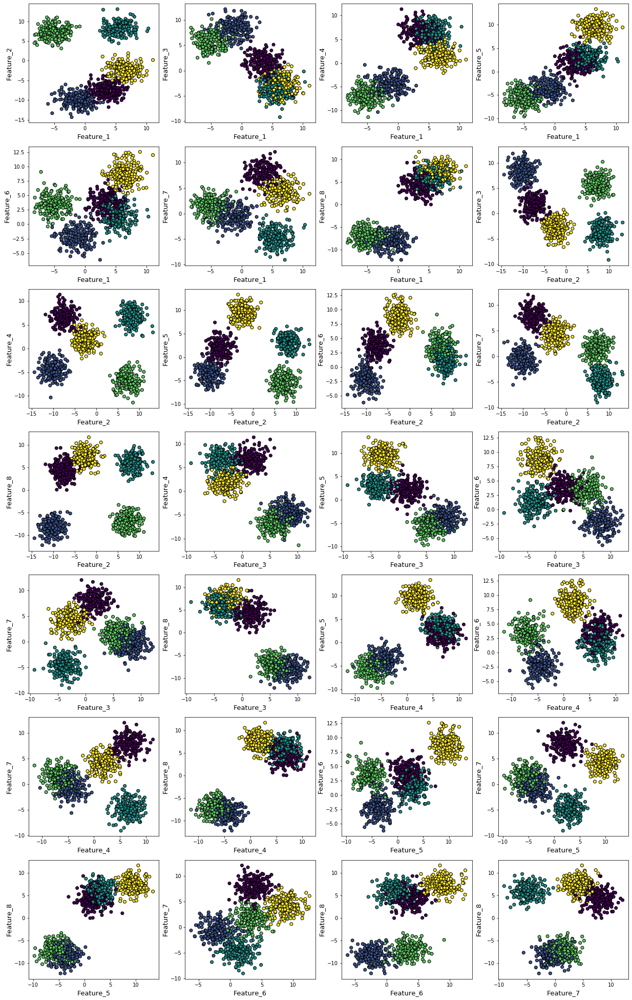

In [10]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [11]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,1.874842,4.615221,-8.222017,-2.294379,3.323308,5.665790,11.069784
Feature_2,1000.0,-0.938015,7.618353,-14.352415,-8.231011,-2.480599,7.252676,13.106073
Feature_3,1000.0,1.831234,4.967307,-9.200553,-2.860654,1.643230,6.355300,12.156411
Feature_4,1000.0,0.768340,5.801737,-11.430412,-5.011437,1.789814,6.244834,11.363553
Feature_5,1000.0,1.063925,5.527578,-9.728875,-4.045152,1.405833,4.289386,13.329279
Feature_6,1000.0,3.020933,3.854725,-6.194714,0.452646,2.849934,5.334712,12.580610
Feature_7,1000.0,1.678986,4.519915,-9.058462,-1.734491,1.750337,5.033749,12.039876
Feature_8,1000.0,0.462195,6.879904,-12.239055,-7.178045,3.887900,6.278190,11.642779


## k-means clustering

In [13]:
from sklearn.cluster import KMeans

### Unlabled data

In [14]:
X=df1

In [15]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,4.990792,-9.082767,0.871791,6.390657,5.444735,3.212907,6.482452,4.218963
1,-0.780449,-12.622474,7.437650,-1.275347,-2.242999,-3.284408,-2.048555,-8.954361
2,5.034591,-1.545604,-0.460813,3.027779,9.293984,7.316454,6.107114,8.497053
3,6.176798,8.984814,-4.243014,6.700406,1.998104,2.401363,-4.064555,7.153372
4,7.008987,-3.820839,-5.036936,1.539823,9.681852,7.820287,4.538459,3.799924


In [16]:
y=data1[1]

### Scaling

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
scaler = MinMaxScaler()

In [19]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [20]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

In [21]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -213.1758037542726
Silhouette score for number of cluster(s) 2: 0.5179955731810493
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -132.31298351903592
Silhouette score for number of cluster(s) 3: 0.5452456612835003
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -75.69320825340654
Silhouette score for number of cluster(s) 4: 0.5883194392034965
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -37.91115243106546
Silhouette score for number of cluster(s) 5: 0.6387671277419532
V-measure score for number of cluster(s)

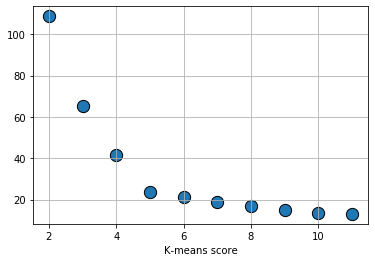

In [96]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

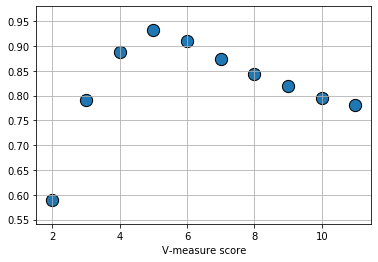

In [95]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [24]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [25]:
preds_km = km.predict(X_scaled)

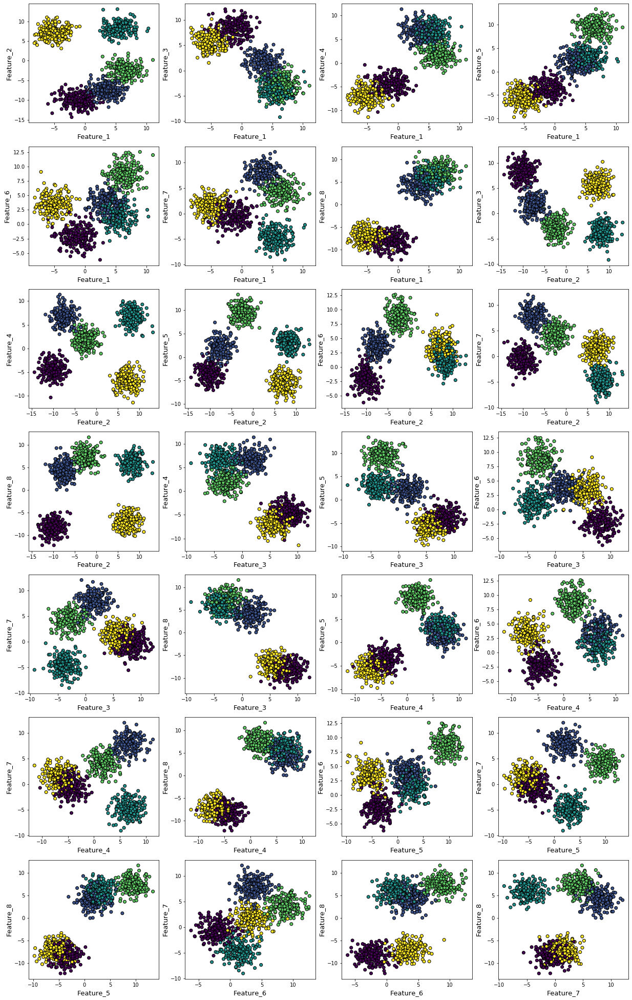

In [26]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [27]:
from sklearn.mixture import GaussianMixture

In [28]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -13205.496765075652
Log-likelihood score for number of cluster(s) 2: 6.910143492452531
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14637.426300571624
Log-likelihood score for number of cluster(s) 3: 7.781532753977616
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -15303.962917465593
Log-likelihood score for number of cluster(s) 4: 8.270225556201698
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15702.457074446324
Log-likelihood score for number of cluster(s) 5: 8.624897128469161
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15477.506447060363
Log-likelihood score for number of cluster(s) 6: 8.667846308553278
-

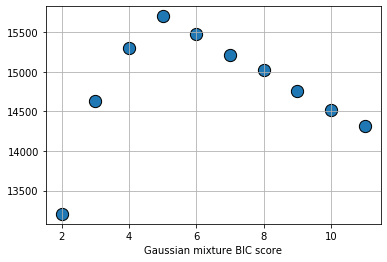

In [94]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

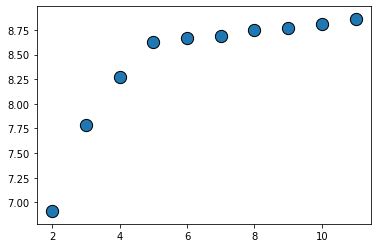

In [93]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [31]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [32]:
gm.means_

array([[0.61066286, 0.24595866, 0.50882119, 0.79583393, 0.50800235,
        0.52657803, 0.80440139, 0.69289571],
       [0.16503566, 0.78284338, 0.70001494, 0.19921205, 0.18388743,
        0.51341416, 0.50556511, 0.2153751 ],
       [0.71154737, 0.82269434, 0.25442464, 0.79358186, 0.55272748,
        0.40369626, 0.20647585, 0.76115015],
       [0.36440956, 0.15767815, 0.82383377, 0.30696105, 0.26194466,
        0.21427132, 0.40122612, 0.16837208],
       [0.76522272, 0.43349463, 0.29561972, 0.58028422, 0.83378173,
        0.79623146, 0.62695091, 0.82139349]])

In [33]:
km.cluster_centers_

array([[0.36440956, 0.15767815, 0.82383377, 0.30696105, 0.26194466,
        0.21427132, 0.40122612, 0.16837208],
       [0.61066286, 0.24595866, 0.50882119, 0.79583393, 0.50800235,
        0.52657803, 0.80440139, 0.69289571],
       [0.71154737, 0.82269434, 0.25442464, 0.79358186, 0.55272748,
        0.40369626, 0.20647585, 0.76115015],
       [0.76522272, 0.43349463, 0.29561972, 0.58028422, 0.83378173,
        0.79623146, 0.62695091, 0.82139349],
       [0.16503566, 0.78284338, 0.70001494, 0.19921205, 0.18388743,
        0.51341416, 0.50556511, 0.2153751 ]])

In [34]:
gm.means_/km.cluster_centers_

array([[1.67575974, 1.55987791, 0.61762604, 2.59262184, 1.93934994,
        2.45752924, 2.00485797, 4.11526492],
       [0.27025658, 3.18282508, 1.37575824, 0.25031862, 0.36198145,
        0.97500111, 0.62849855, 0.31083337],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [0.47621372, 0.36373725, 2.78680245, 0.52898397, 0.31416454,
        0.26910682, 0.63996417, 0.20498346],
       [4.63671141, 0.55374376, 0.42230488, 2.9128972 , 4.53419656,
        1.55085604, 1.24009925, 3.81378105]])

In [35]:
preds_gm=gm.predict(X_scaled)

In [36]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [37]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [38]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [39]:
silhouette_score(X_scaled,preds_km)

0.6387671277419532

In [40]:
silhouette_score(X_scaled,preds_gm)

0.6387671277419532

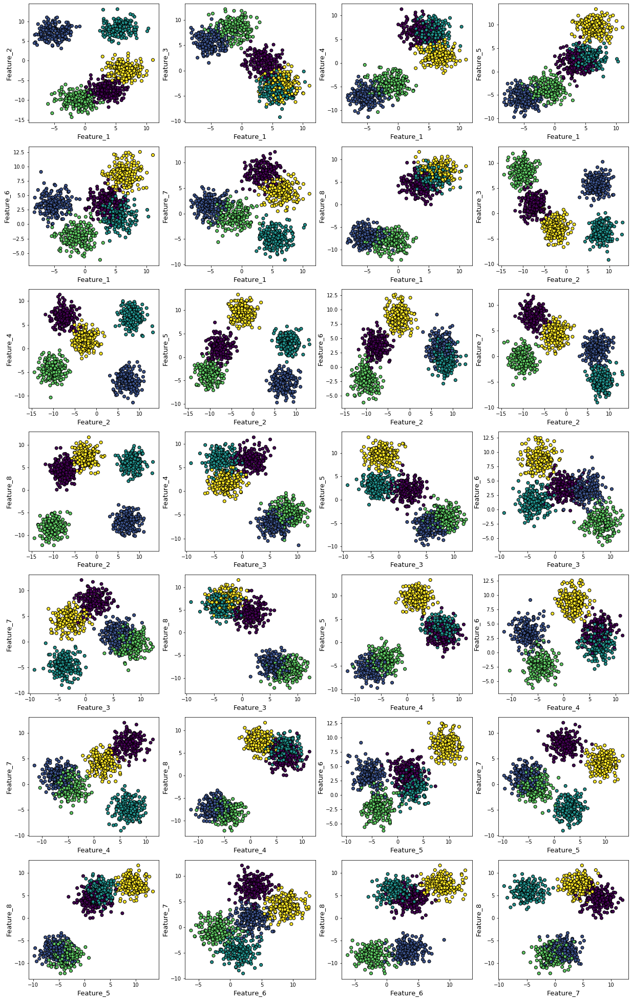

In [41]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [42]:
from sklearn.decomposition import PCA

In [43]:
n_prin_comp = 3

In [44]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [45]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [46]:
pca_explained_var = pca_full.explained_variance_ratio_

In [47]:
cum_explaiend_var = pca_explained_var.cumsum()

In [48]:
cum_explaiend_var

array([0.58557172, 0.79647933, 0.90715651, 0.95816582, 0.97028305,
       0.98184598, 0.99166691, 1.        ])

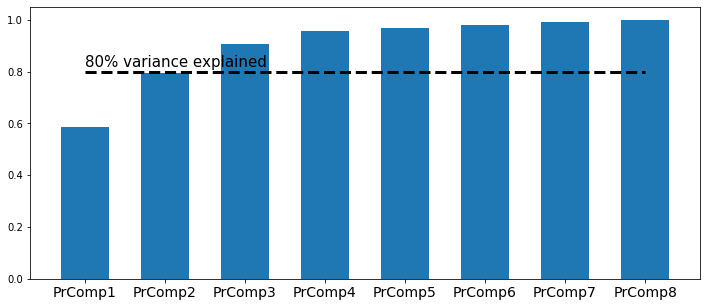

In [49]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

In [50]:
X_pca = pca_partial.fit_transform(X_scaled)

In [51]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

In [52]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -169.09869011384518
Silhouette score for number of cluster(s) 2: 0.5827325345032012
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -88.24495218092622
Silhouette score for number of cluster(s) 3: 0.6512420554486249
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -35.48809662182164
Silhouette score for number of cluster(s) 4: 0.7220540399231042
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -13.337906664224475
Silhouette score for number of cluster(s) 5: 0.7539386544728407
V-measure score for number of cluster(s

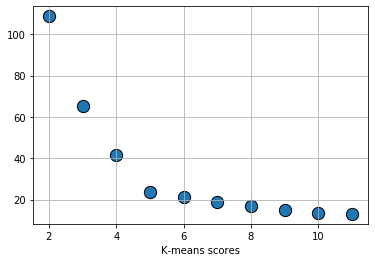

In [92]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

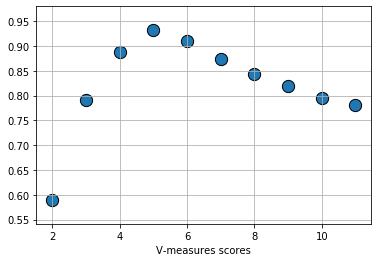

In [91]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

In [55]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

In [56]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

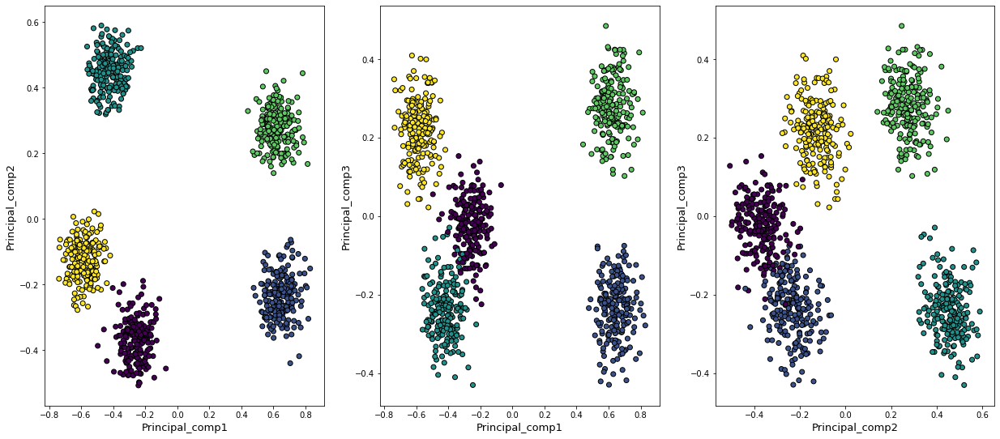

In [57]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [58]:
from sklearn.decomposition import FastICA

In [59]:
n_ind_comp = 3

In [60]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [61]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

c:\program files\python37\lib\site-packages\sklearn\decomposition\fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [62]:
X_ica = ica_partial.fit_transform(X_scaled)

In [63]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

In [64]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.0442719579919104
Silhouette score for number of cluster(s) 2: 0.39559077431646805
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.1097853915466622
Silhouette score for number of cluster(s) 3: 0.5660466485477773
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.35315719558817327
Silhouette score for number of cluster(s) 4: 0.7123757225736221
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.14940449050401994
Silhouette score for number of cluster(s) 5: 0.7412646058328913
V-measure score for number of clus

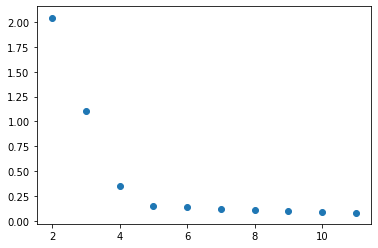

In [65]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

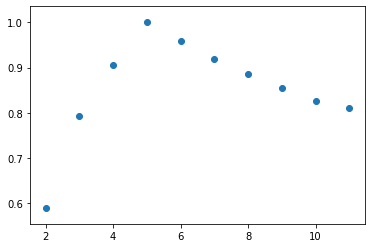

In [66]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

In [67]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

In [68]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

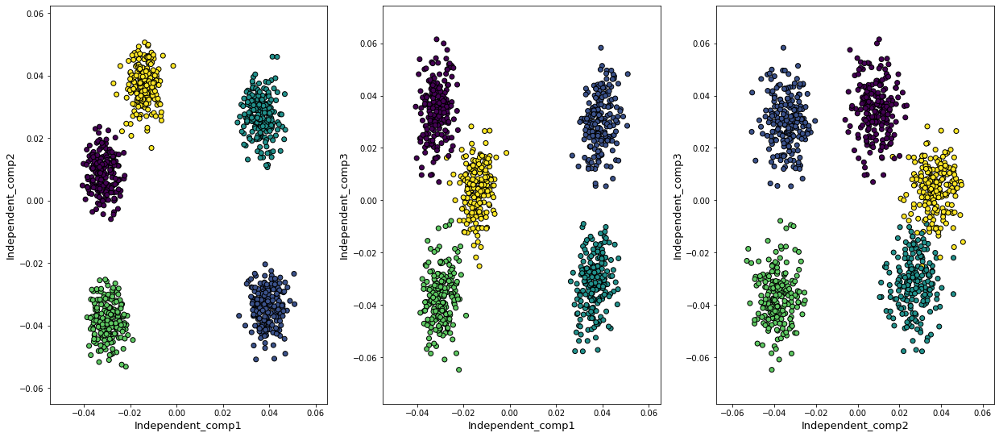

In [69]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [70]:
from sklearn.random_projection import GaussianRandomProjection

In [71]:
n_random_comp = 3

In [72]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [73]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [74]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

In [75]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -108.72933492548688
Silhouette score for number of cluster(s) 2: 0.6150460763079117
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -65.28896711446734
Silhouette score for number of cluster(s) 3: 0.5728431670873194
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -41.42257743853478
Silhouette score for number of cluster(s) 4: 0.6240342024423224
V-measure score for number of cluster(s) 4: 0.8881172546211675
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -23.538253745624566
Silhouette score for number of cluster(s) 5: 0.5811199537643463
V-measure score for number of cluster(s

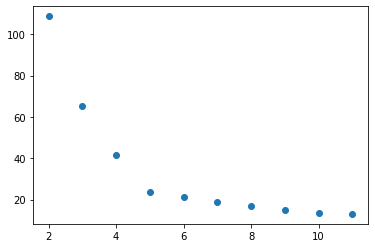

In [76]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

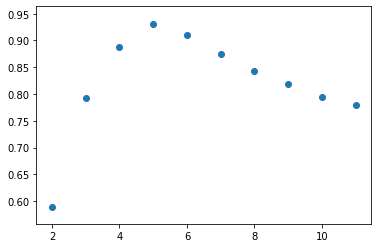

In [77]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

In [78]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

In [79]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

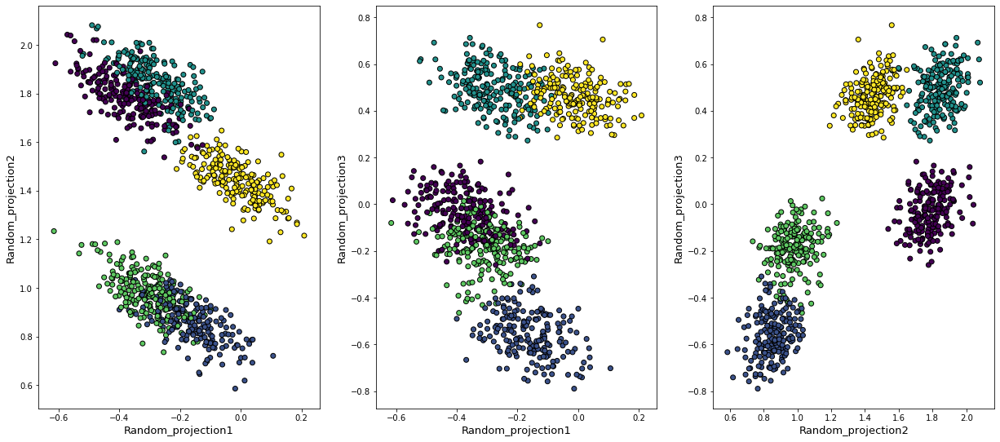

In [80]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [81]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

Score for iteration 0: -51.804005150954964
Silhouette score for iteration 0: 0.4225296646215942
V-measure score for iteration 0: 0.7589350467978031
----------------------------------------------------------------------------------------------------


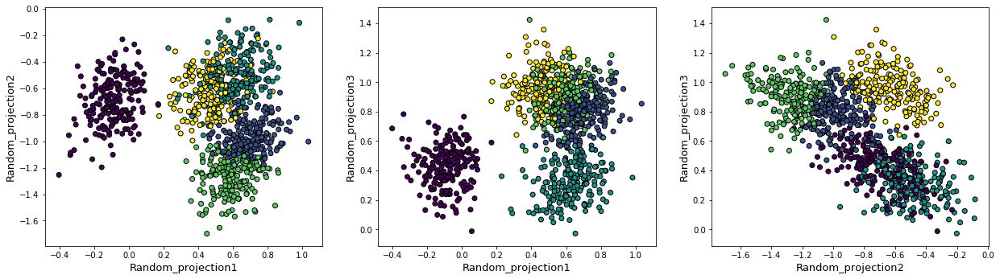

Score for iteration 1: -19.27484189021586
Silhouette score for iteration 1: 0.43882062341863026
V-measure score for iteration 1: 0.8320399528133794
----------------------------------------------------------------------------------------------------


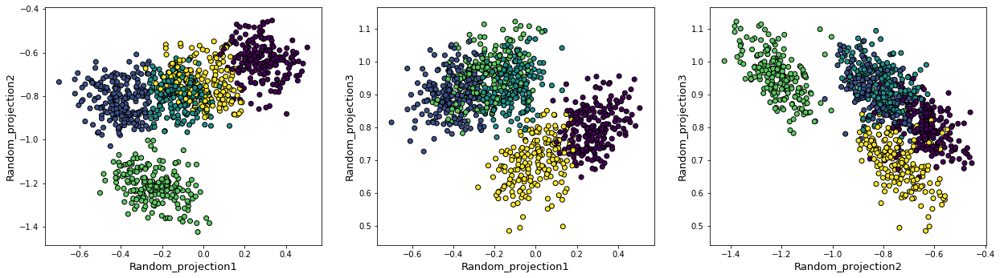

Score for iteration 2: -35.8236740296624
Silhouette score for iteration 2: 0.5222556186785831
V-measure score for iteration 2: 0.8342125126216047
----------------------------------------------------------------------------------------------------


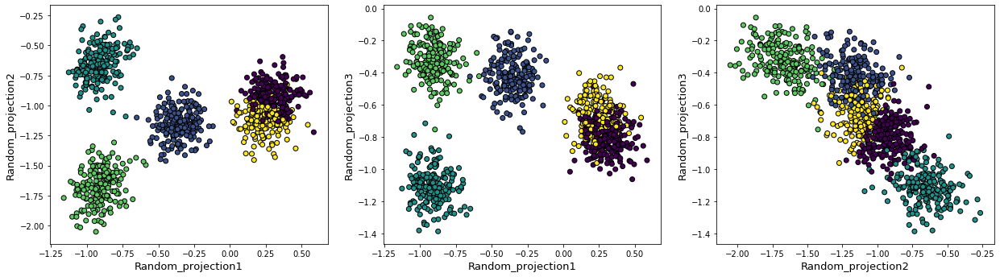

Score for iteration 3: -27.794179551961257
Silhouette score for iteration 3: 0.5928573194014382
V-measure score for iteration 3: 0.9062210893973692
----------------------------------------------------------------------------------------------------


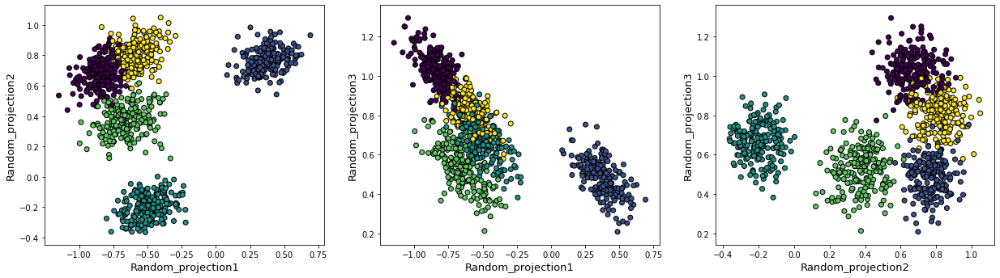

Score for iteration 4: -44.03586921205549
Silhouette score for iteration 4: 0.6346276673099741
V-measure score for iteration 4: 0.9813038496497519
----------------------------------------------------------------------------------------------------


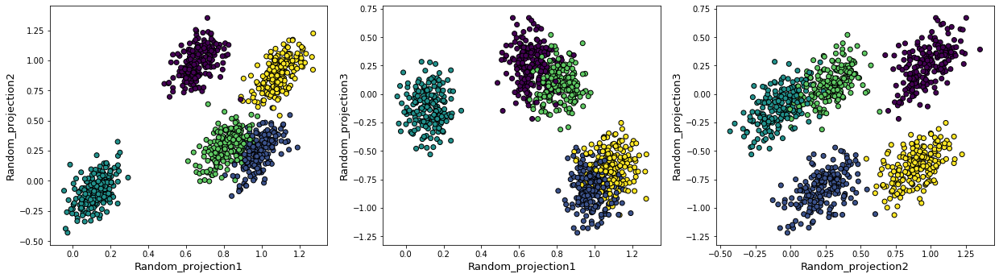

Score for iteration 5: -19.888481510925782
Silhouette score for iteration 5: 0.3905716399767413
V-measure score for iteration 5: 0.732339161768628
----------------------------------------------------------------------------------------------------


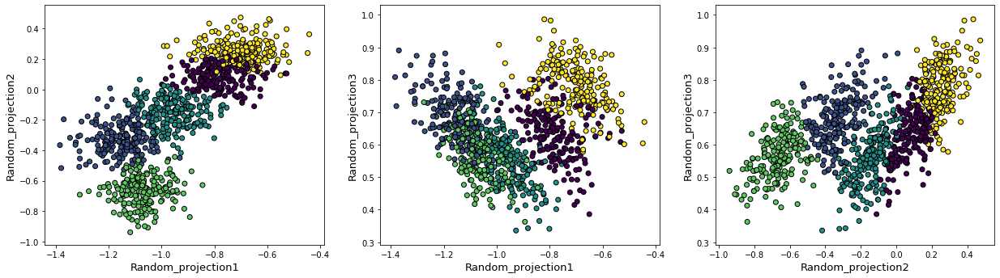

Score for iteration 6: -13.795428151165442
Silhouette score for iteration 6: 0.5778639908559473
V-measure score for iteration 6: 0.9039506162150731
----------------------------------------------------------------------------------------------------


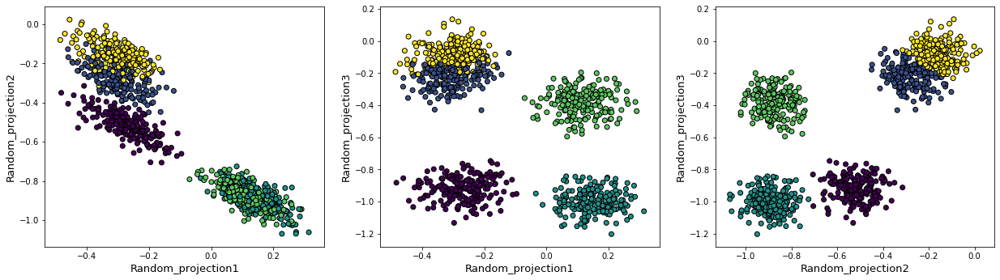

Score for iteration 7: -42.38948891338657
Silhouette score for iteration 7: 0.5628838204973815
V-measure score for iteration 7: 0.9930346013311964
----------------------------------------------------------------------------------------------------


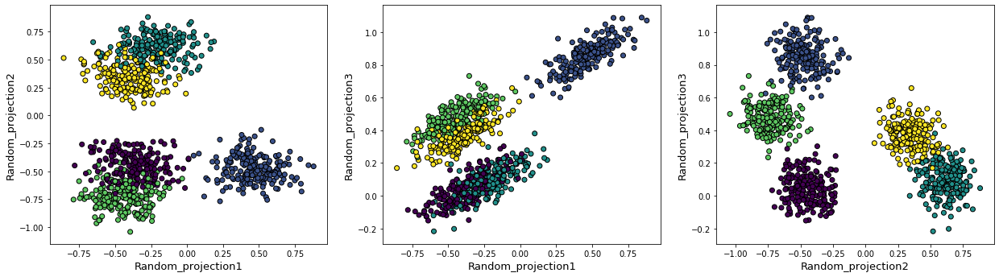

Score for iteration 8: -52.80054799361462
Silhouette score for iteration 8: 0.3657287720200757
V-measure score for iteration 8: 0.7405886755951101
----------------------------------------------------------------------------------------------------


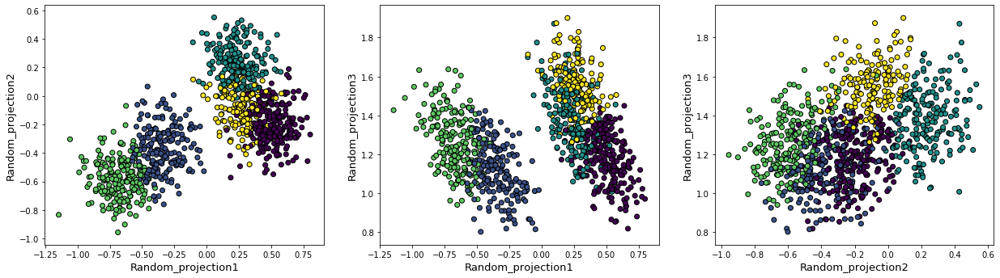

Score for iteration 9: -23.020320345020057
Silhouette score for iteration 9: 0.5930489815079502
V-measure score for iteration 9: 0.9499458736045409
----------------------------------------------------------------------------------------------------


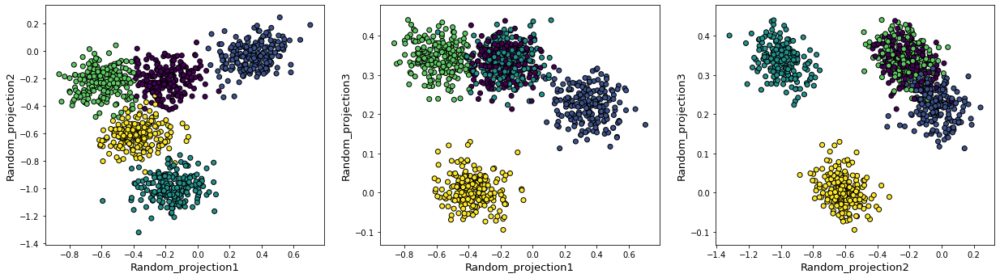

Score for iteration 10: -33.00770974742527
Silhouette score for iteration 10: 0.44681997034310433
V-measure score for iteration 10: 0.8291450853472282
----------------------------------------------------------------------------------------------------


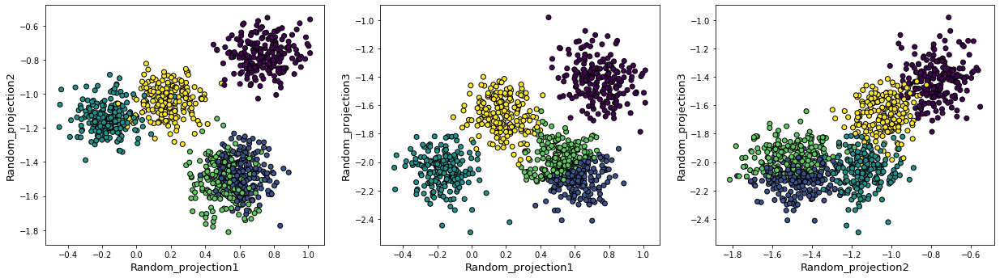

Score for iteration 11: -50.56139916544864
Silhouette score for iteration 11: 0.501079881530276
V-measure score for iteration 11: 0.8438490920227738
----------------------------------------------------------------------------------------------------


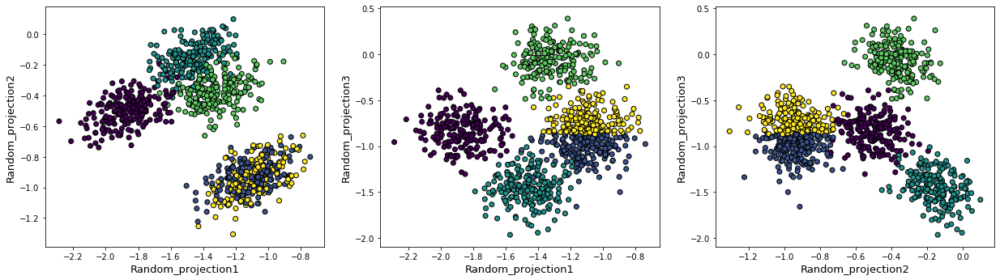

Score for iteration 12: -28.466196416161296
Silhouette score for iteration 12: 0.42872112340515506
V-measure score for iteration 12: 0.8051610327945621
----------------------------------------------------------------------------------------------------


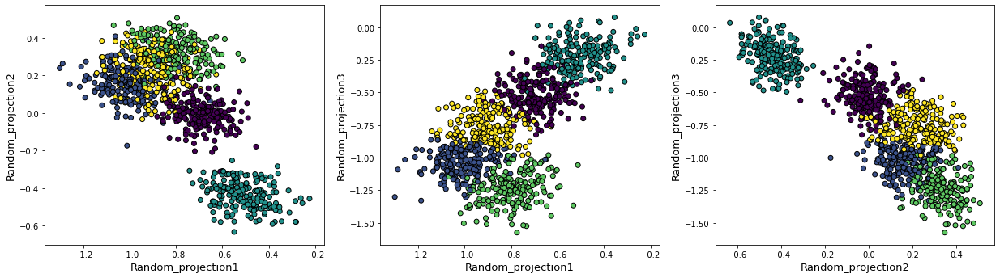

Score for iteration 13: -32.841403530417814
Silhouette score for iteration 13: 0.6960491338864279
V-measure score for iteration 13: 0.9960866319013288
----------------------------------------------------------------------------------------------------


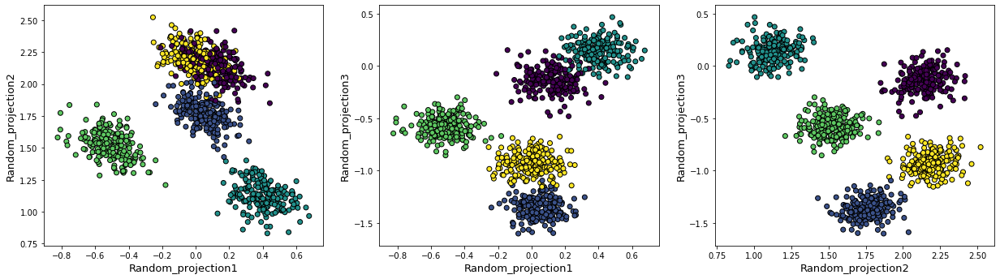

Score for iteration 14: -30.87103181156933
Silhouette score for iteration 14: 0.434427047679983
V-measure score for iteration 14: 0.8612695873717946
----------------------------------------------------------------------------------------------------


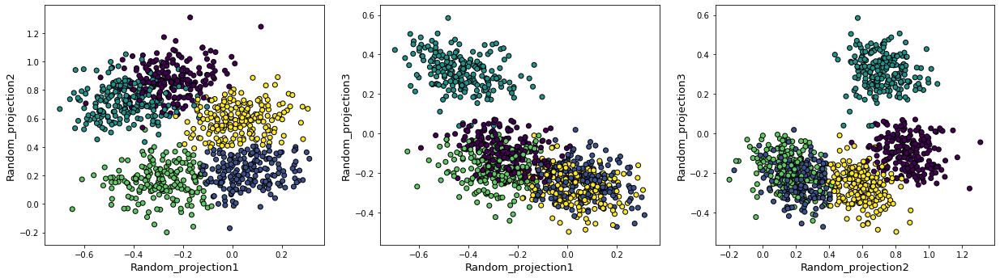

Score for iteration 15: -19.31818917264638
Silhouette score for iteration 15: 0.5136509361539758
V-measure score for iteration 15: 0.866827839809779
----------------------------------------------------------------------------------------------------


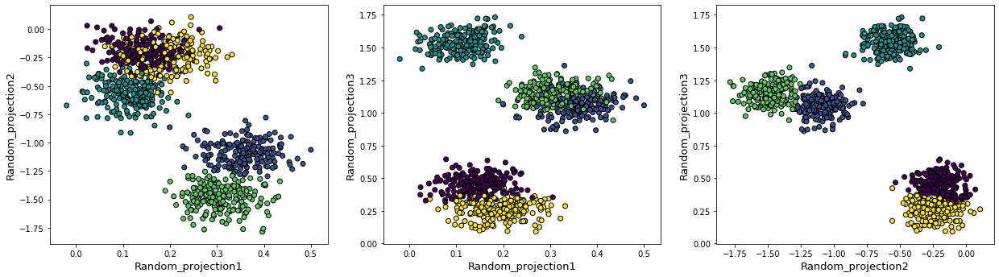

Score for iteration 16: -32.71470545328701
Silhouette score for iteration 16: 0.5230565747628154
V-measure score for iteration 16: 0.8384172044661217
----------------------------------------------------------------------------------------------------


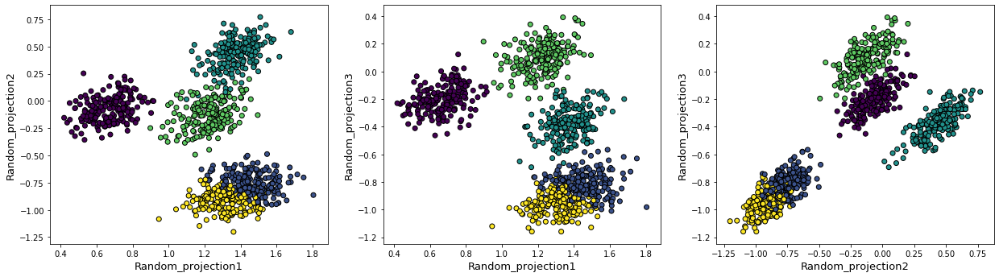

Score for iteration 17: -42.95181419949162
Silhouette score for iteration 17: 0.5245561795007441
V-measure score for iteration 17: 0.796263739407199
----------------------------------------------------------------------------------------------------


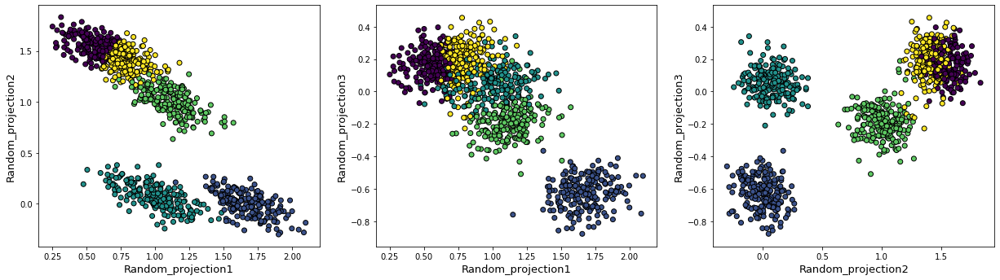

Score for iteration 18: -26.72674291232747
Silhouette score for iteration 18: 0.6127901865685303
V-measure score for iteration 18: 0.979434971250246
----------------------------------------------------------------------------------------------------


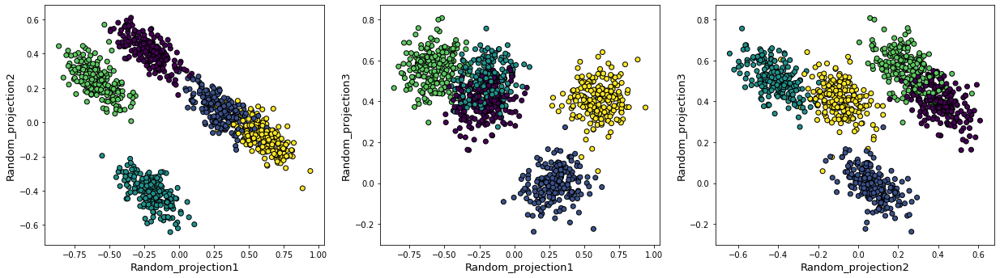

Score for iteration 19: -36.811682633414335
Silhouette score for iteration 19: 0.4626802270366495
V-measure score for iteration 19: 0.8526210061406365
----------------------------------------------------------------------------------------------------


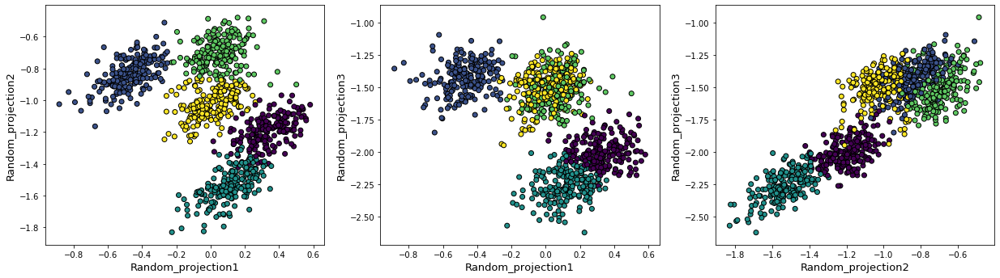

In [82]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

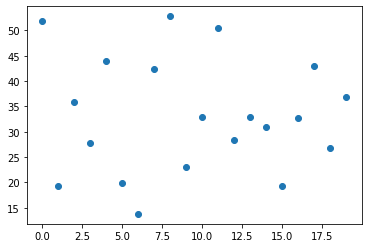

In [83]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

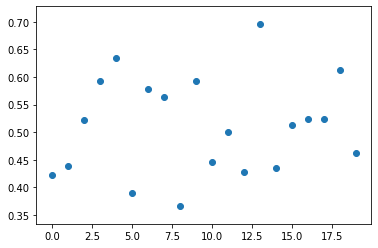

In [84]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

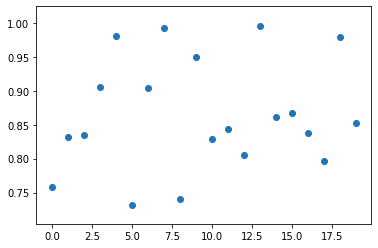

In [85]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [86]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -13.337906664224475
Silhouette score for iteration 0: 0.7539386544728407
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -13.337906664224475
Silhouette score for iteration 1: 0.7539386544728407
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -13.337906664224475
Silhouette score for iteration 2: 0.7539386544728407
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -13.337906664224475
Silhouette score for iteration 3: 0.7539386544728407
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -13.337906664224475
Silhouette score for 